In [2]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import scipy
from mpl_toolkits.basemap import Basemap
import eofs.xarray as Eof
plt.rcParams['figure.dpi'] = 300
%config InlineBackend.figure_format = 'retina'
from sklearn.decomposition import PCA

In [3]:
def basemap_base(name_projection,axes,lat,lon,latS,latN,lonL,lonR):
    m = Basemap(projection=name_projection,
                llcrnrlat=latS,urcrnrlat=latN,\
                llcrnrlon=lonL,urcrnrlon=lonR,resolution='l',ax=axes)

    lon2, lat2 = np.meshgrid(lon,lat)
    x, y = m(lon2,lat2)

    m.fillcontinents(color='grey',lake_color='gray')
    m.drawcoastlines(linewidth=0.5)
    m.drawparallels(np.arange(-80.,81.,20.), 
                    labels = [1,0,0,0],fontsize = 15,color = 'grey',linewidth = 0.6 )
    m.drawmeridians(np.arange(-180.,181.,30.),
                    labels = [0,0,0,1],fontsize = 15,color = 'grey',linewidth = 0.6 )
    m.drawmapboundary(fill_color='white')
    
    return m, x, y;

## 1. Read the SST data (NCEP Reanalysis)

In [4]:
dir_name  = "./DATA/"
file_name = "sst_anom.mon.mean.nc"
path_name = dir_name+file_name

f         = xr.open_dataset(path_name)

sst       = f.sst  ## SST (Sea Surface Temperature) [C]
lat       = f.lat  ## Latitude  [^o]
lon       = f.lon  ## Longitude [^o]
time      = f.time ## Time      [Month]

### 1-1) Slice the latitude / logitude / time

In [5]:
latS = -30.     ; latN = 30.
lonL = 110.     ; lonR = 290.
year_str = 1982 ; year_end = 2020

In [6]:
## Find the time index for speicified year
ind_year = np.where((time.dt.year>=year_str) & 
                    (time.dt.year<=year_end))[0]

## Slice the SST array for specified time, latitude and longitude
sst_slice = sst.sel(lat=slice(latN,latS),lon=slice(lonL,lonR))[ind_year,:,:]
Nt, Ny, Nx = sst_slice.shape

### 1-2) Make the SST array to 2D matrix

In [7]:
## Convert the array to 2D matrix
sst_2D   = sst_slice.values.reshape(Nt,-1)

## Find the non-NaN values and reduce the matrix
ind_nnan = np.where(~np.isnan(sst_2D[0,:]))[0]
sst_2D_nnan = sst_2D[:,ind_nnan]

Nt, Ns = sst_2D_nnan.shape

## 2. Conduct the EOF & PCA Decomposition
### (Empirical Orthogonal Functions & Principal Component Analysis)

### $C_{\textrm{cov}}=\begin{bmatrix}
                            E[(X_1-\mu_1)(X_1-\mu_1)] & E[(X_1-\mu_1)(X_2-\mu_2)] & \cdots & E[(X_1-\mu_1)(X_{Nt}-\mu_{Nt})] \\
E[(X_2-\mu_2)(X_1-\mu_1)] & E[(X_2-\mu_2)(X_2-\mu_2)] & \cdots & E[(X_2-\mu_2)(X_{Nt}-\mu_{Nt})] \\ 
\vdots & \vdots & \ddots & \vdots \\
E[(X_{Nt}-\mu_{Nt})(X_1-\mu_1)] & E[(X_{Nt}-\mu_{Nt})(X_2-\mu_2)] & \cdots & E[(X_{Nt}-\mu_{Nt})(X_{Nt}-\mu_{Nt})]
                        \end{bmatrix}$

### $C_{\textrm{corr}}=\begin{bmatrix}
                            1 & \frac{E[(X_1-\mu_1)(X_2-\mu_2)]}{\sigma(X_1)\sigma(X_2)} & \cdots & \frac{E[(X_1-\mu_1)(X_n-\mu_n)]}{\sigma(X_1)\sigma(X_n)} \\
\frac{E[(X_2-\mu_2)(X_1-\mu_1)]}{\sigma(X_2)\sigma(X_1)} & 1 & \cdots & \frac{E[(X_2-\mu_2)(X_n-\mu_n)]}{\sigma(X_2)\sigma(X_n)} \\ 
\vdots & \vdots & \ddots & \vdots \\
\frac{E[(X_n-\mu_n)(X_1-\mu_1)]}{\sigma(X_n)\sigma(X_1)} & \frac{E[(X_n-\mu_n)(X_2-\mu_2)]}{\sigma(X_n)\sigma(X_2)} & \cdots & 1
                        \end{bmatrix}$

### 2-1) Using EOFs modules

In [8]:
N_comp  = 5 ## The number of PC (Principal Component)
eof_var = sst_slice

## Conduct the EOF & PCA Decomposition
solver = Eof.Eof(eof_var)

SP_pc_cov = solver.eofsAsCovariance(neofs=N_comp)   ## Spatial patterns for PCs [Covariance]
SP_pc_cor = solver.eofsAsCorrelation(neofs=N_comp)  ## Spatial patterns for PCs [Correlation]
SP_pc     = solver.eofs(neofs=N_comp)               ## Spatial patterns for PCs

TS_pc     = solver.pcs(npcs=N_comp)                 ## Time-Series of PCs 
VAR_pc    = solver.varianceFraction(neigs=N_comp)   ## Variances for PCs
EIG_pc    = solver.eigenvalues(neigs=5)             ## Eigenvalues for PCs

### 2-2) Using PCA modules from Scipy

In [10]:
N_comp  = 5
pca_var = sst_2D_nnan

## Conduct the EOF & PCA Decomposition
pca = PCA(n_components=N_comp)
pca.fit(pca_var)

VAR_pc =  pca.explained_variance_ratio_    ## Variances for PCs
SP_pc  =  pca.components_                  ## Spatial patterns of PCs 
TS_pc  =  pca.fit_transform(sst_2D_nnan)   ## Time-Series for PCs

### 2-3) Directly Calculate PC Time Series & Eigenvalues

In [13]:
type_decomp = "EIG"    ## Decomposition Method : "SVD", "EIG"
type_matrix = "Time"   ## Correlation Type     : "Time", "Space"

## Calculate Eigenvalues and Eigenvectors
if  (type_decomp == "SVD"):
    if (type_matrix == "Time"):
        eigvec_cov,eigval_cov,tmp = np.linalg.svd(np.cov(sst_2D_nnan))
        eigvec_cor,eigval_cor,tmp = np.linalg.svd(np.corrcoef(sst_2D_nnan))
    elif (type_matrix == "Space"):
        eigvec_cov,eigval_cov,tmp = np.linalg.svd(np.cov(sst_2D_nnan.T))
        eigvec_cor,eigval_cor,tmp = np.linalg.svd(np.corrcoef(sst_2D_nnan.T))
        
elif (type_decomp == "EIG"):
    if (type_matrix == "Time"):
        eigval_cov,eigvec_cov = np.linalg.eig(np.cov(sst_2D_nnan))
        eigval_cor,eigvec_cor = np.linalg.eig(np.corrcoef(sst_2D_nnan))
    elif (type_matrix == "Space"):
        eigval_cov,eigvec_cov = np.linalg.eig(np.cov(sst_2D_nnan.T))
        eigval_cor,eigvec_cor = np.linalg.eig(np.corrcoef(sst_2D_nnan.T))                


In [14]:
## Reconstruct the PC Time/Space Series
if (type_matrix == "Time"):
    TS_cov = eigvec_cov                       ; TS_cor = eigvec_cor
    SP_cov = np.dot(sst_2D_nnan.T,eigvec_cov) ; SP_cor = np.dot(sst_2D_nnan.T,eigvec_cor)
elif (type_matrix == "Space"):
    SP_cov = eigvec_cov                     ; SP_cor = eigvec_cor    
    TS_cov = np.dot(sst_2D_nnan,eigvec_cov) ; TS_cor = np.dot(sst_2D_nnan,eigvec_cor)

## 3. Plot PCA & EOF Statistics

### 3-1) Plot the Variance Ratio fo each PC

/Users/blackcata/opt/anaconda3/lib/python3.8/site-packages/matplotlib/transforms.py:789: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.array(args, dtype=float).reshape(2, 2)
/Users/blackcata/opt/anaconda3/lib/python3.8/site-packages/matplotlib/transforms.py:789: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.array(args, dtype=float).reshape(2, 2)


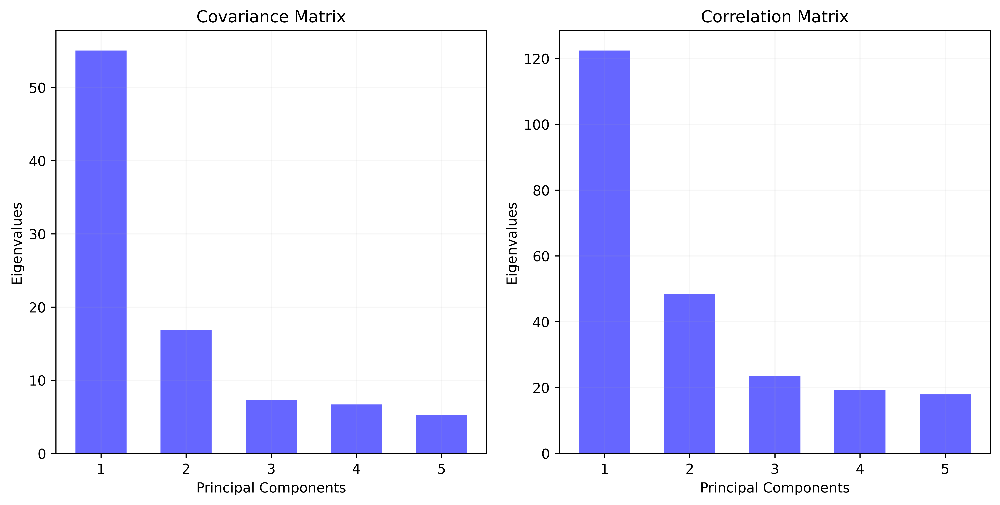

In [15]:
figs,axes = plt.subplots(1,2,figsize=(10,5),constrained_layout=True)
axes[0].bar(np.linspace(1,N_comp,N_comp),eigval_cov[0:N_comp],
                     color='b',width=0.6,alpha=0.6)

axes[1].bar(np.linspace(1,N_comp,N_comp),eigval_cor[0:N_comp],
                     color='b',width=0.6,alpha=0.6)

for ind_ax in range(2):
    axes[ind_ax].set_xlabel("Principal Components")
    axes[ind_ax].set_ylabel("Eigenvalues")
    axes[ind_ax].grid(alpha=0.1)

axes[0].set_title("Covariance Matrix")
axes[1].set_title("Correlation Matrix")

plt.savefig("Eigenvalues_PC.pdf")

### 3-2) Plot the PC Time Series

In [20]:
fig, axes = plt.subplots(4,2,figsize=(20,12),constrained_layout=True)

for ind_PC in range(4):
    ## Specify the input parameters for PC time series [Covariance Matrix]
    ind_pos = np.where(TS_cov[:,ind_PC]>=0)[0]
    ind_neg = np.where(TS_cov[:,ind_PC]<0)[0]

    if (ind_PC == 1): tmp_TS = -TS_cov[:,ind_PC]
    else:             tmp_TS = TS_cov[:,ind_PC]
        
    std_PC = TS_cov[:,ind_PC].std()
    eig_PC = np.real(eigval_cov)
    
    ## Plot PC Time Series    
    axes[ind_PC][0].bar(time[ind_year][ind_pos],tmp_TS[ind_pos],
                     width=3e+1,color='r',alpha=0.7)
    axes[ind_PC][0].bar(time[ind_year][ind_neg],tmp_TS[ind_neg],
                     width=3e+1,color='b',alpha=0.7) 
    
    ## Specifiy the Plot options
    axes[ind_PC][0].set_xlabel("Time [Year]")
    axes[ind_PC][0].set_ylabel("Amplitude")
    axes[ind_PC][0].set_title("EOF"+str(ind_PC+1)+
                           " ({:4.2f}%)".format(eig_PC[ind_PC]/eig_PC.sum()*100))
    axes[ind_PC][0].grid(alpha=0.2)
    if   (type_matrix == "Time"): axes[ind_PC][0].set_ylim([-0.12,0.15])
    elif (type_matrix == "Space"):  axes[ind_PC][0].set_ylim([-100,125])

    ## Specify the input parameters for PC time series [Correlation Matrix]
    ind_pos = np.where(-TS_cor[:,ind_PC]>=0)[0]
    ind_neg = np.where(-TS_cor[:,ind_PC]<0)[0]    
    
    if (ind_PC == 1): tmp_TS = TS_cor[:,ind_PC]
    else:             tmp_TS = -TS_cor[:,ind_PC]

    std_PC = TS_cor[:,ind_PC].std()
    eig_PC = np.real(eigval_cor)
    
    ## Plot PC Time Series    
    axes[ind_PC][1].bar(time[ind_year][ind_pos],tmp_TS[ind_pos],
                     width=3e+1,color='r',alpha=0.7)
    axes[ind_PC][1].bar(time[ind_year][ind_neg],tmp_TS[ind_neg],
                     width=3e+1,color='b',alpha=0.7) 
    
    ## Specifiy the Plot options
    axes[ind_PC][1].set_xlabel("Time [Year]")
    axes[ind_PC][1].set_ylabel("Amplitude")
    axes[ind_PC][1].set_title("EOF"+str(ind_PC+1)+
                           " ({:4.2f}%)".format(eig_PC[ind_PC]/eig_PC.sum()*100))
    axes[ind_PC][1].grid(alpha=0.2)
    if   (type_matrix == "Time"): axes[ind_PC][1].set_ylim([-0.12,0.12])
    elif (type_matrix == "Space"):  axes[ind_PC][1].set_ylim([-100,125])

plt.savefig("./PC_Time_Series.pdf")

/Users/blackcata/opt/anaconda3/lib/python3.8/site-packages/matplotlib/transforms.py:789: ComplexWarning: Casting complex values to real discards the imaginary part
  points = np.array(args, dtype=float).reshape(2, 2)


### 3-3) Plot the PC Spatial Pattern for each PC [Covariance & Correlation]

In [21]:
fig, axes = plt.subplots(4,2,figsize=(30,20),constrained_layout=True)

for ind_PC in range(4):
    sst_recon_1D    = np.empty([Ny*Nx])
    sst_recon_1D[:] = np.NaN
    
    eig_PC = np.real(eigval_cov)
    sst_recon_1D[ind_nnan] = SP_cov[:,ind_PC]

    if (ind_PC==1): tmp_var = -sst_recon_1D.reshape(Ny,Nx)
    else:           tmp_var = sst_recon_1D.reshape(Ny,Nx)

    m, x, y = basemap_base('cyl',axes[ind_PC][0],lat.sel(lat=slice(latN,latS)),
                                              lon.sel(lon=slice(lonL,lonR)),
                                              latS,latN,lonL,lonR)

    if   (type_matrix == "Time"): vmin   = -1e+1 ; vmax  = 1e+1
    elif (type_matrix == "Space"): vmin   = -2.5e-2 ; vmax  = 2.5e-2
    levels    = 20    ; level_boundaries = np.linspace(vmin,vmax,levels+1)

    contour_var_1 = m.contourf(x,y,tmp_var,level_boundaries,cmap='RdBu_r',extend='both')
    axes[ind_PC][0].set_title("EOF"+str(ind_PC+1)+
                           " ({:4.2f}%)".format(eig_PC[ind_PC]/eig_PC.sum()*100),fontsize=20)
    
    eig_PC = np.real(eigval_cor)
    sst_recon_1D[ind_nnan] = SP_cor[:,ind_PC]
        
    if (ind_PC==1): tmp_var = sst_recon_1D.reshape(Ny,Nx)
    else:           tmp_var = -sst_recon_1D.reshape(Ny,Nx)

    m, x, y = basemap_base('cyl',axes[ind_PC][1],lat.sel(lat=slice(latN,latS)),
                                              lon.sel(lon=slice(lonL,lonR)),
                                              latS,latN,lonL,lonR)

    if   (type_matrix == "Time"):  vmin   = -1e+1 ; vmax  = 1e+1
    elif (type_matrix == "Space"): vmin   = -2e-2 ; vmax  = 2e-2
    levels    = 20    ; level_boundaries = np.linspace(vmin,vmax,levels+1)

    contour_var_2 = m.contourf(x,y,tmp_var,level_boundaries,cmap='RdBu_r',extend='both')
    axes[ind_PC][1].set_title("EOF"+str(ind_PC+1)+
                           " ({:4.2f}%)".format(eig_PC[ind_PC]/eig_PC.sum()*100),fontsize=20)


cb = fig.colorbar(contour_var_1,ax=axes[:,0],shrink=0.7) ; cb.ax.tick_params(labelsize=15.5)
cb = fig.colorbar(contour_var_2,ax=axes[:,1],shrink=0.7) ; cb.ax.tick_params(labelsize=15.5)

plt.savefig("./Spatial_Pattern_Covariance_Correlation.pdf")

<ipython-input-21-4bb299830720>:8: ComplexWarning: Casting complex values to real discards the imaginary part
  sst_recon_1D[ind_nnan] = SP_cov[:,ind_PC]
<ipython-input-21-4bb299830720>:26: ComplexWarning: Casting complex values to real discards the imaginary part
  sst_recon_1D[ind_nnan] = SP_cor[:,ind_PC]
